In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import product

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imbtools.evaluation import BinaryExperiment

In [3]:
parameters_range = {
    "n_classes": [2],
    "class_sep": [2], 
    "n_clusters_per_class": [2, 3, 4, 5, 6, 7], 
    "weights": [[0.95, 0.05], [0.85, 0.15], [0.90, 0.10], [0.92, 0.08], [0.87, 0.13]], 
    "n_samples": [2000, 3000, 4000, 5000], 
    "n_features": [10, 50, 100], 
    "n_redundant": [0],
    "n_informative":[7],
    "random_state": [5]
}

datasets_parameters = [dict(zip(parameters_range.keys(), parameter_product)) for parameter_product in product(*parameters_range.values())]

In [4]:
imbalanced_datasets = []
for parameters in datasets_parameters:
    imbalanced_datasets.append(make_classification(**parameters))

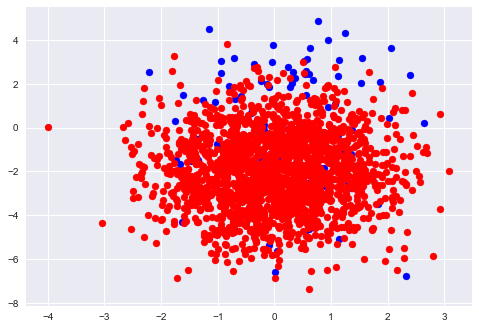

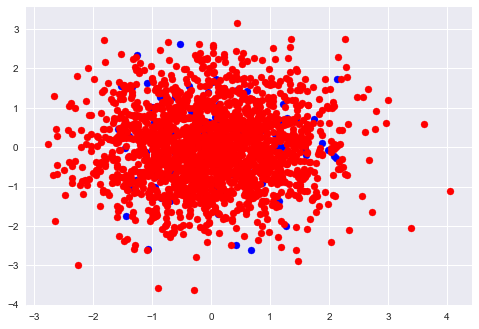

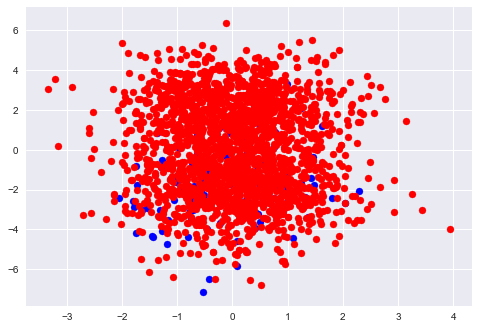

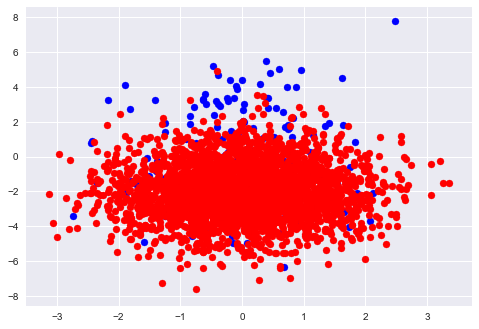

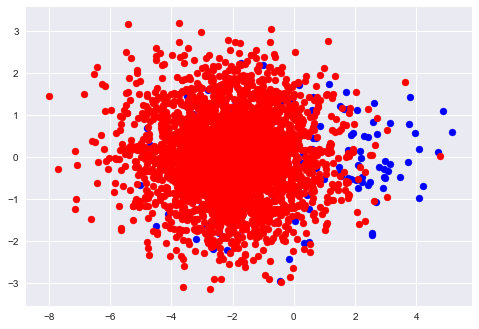

...

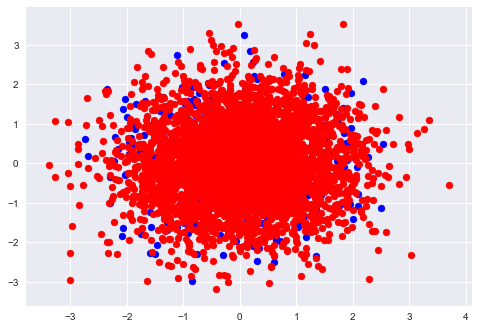

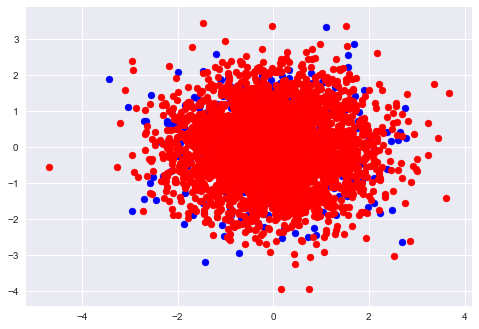

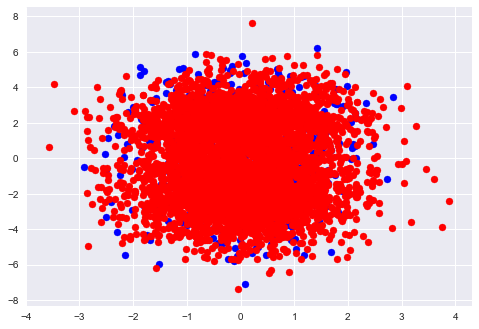

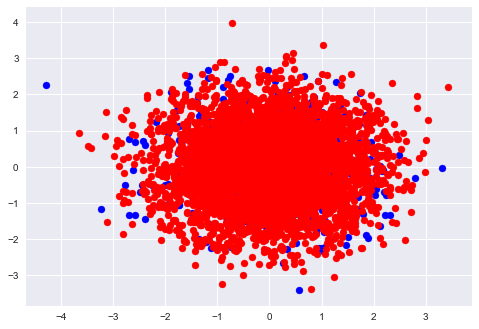

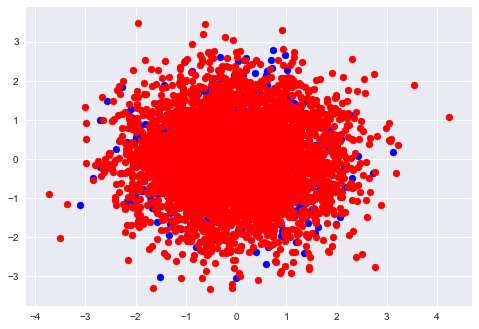

In [5]:
sns.set()
for imbalanced_dataset in imbalanced_datasets:
    X, y = imbalanced_dataset
    minority_indices = (y == 1)
    p = plt.scatter(X[minority_indices, 0], X[minority_indices, 1], color="blue")
    p = plt.scatter(X[~minority_indices, 0], X[~minority_indices, 1], color="red")
    plt.show()

In [6]:
oversampling_methods = [None, RandomOverSampler(), SMOTE()]
classifiers = [LogisticRegression()]

In [7]:
experiment = BinaryExperiment(imbalanced_datasets, classifiers, oversampling_methods)

In [8]:
experiment.run(logging_results=False)

100% (16200 of 16200) |###################| Elapsed Time: 0:36:06 ETA:  0:00:00

In [9]:
experiment.datasets_summary_

,Dataset name,# of features,# of instances,# of minority instances,# of majority instances,Imbalance Ratio
0,dataset_1,10,2000,109,1891,17.35
1,dataset_2,50,2000,113,1887,16.70
2,dataset_3,100,2000,117,1883,16.09
3,dataset_4,10,3000,168,2832,16.86
4,dataset_5,50,3000,166,2834,17.07
5,dataset_6,100,3000,167,2833,16.96
6,dataset_7,10,4000,212,3788,17.87
7,dataset_8,50,4000,218,3782,17.35
8,dataset_9,100,4000,207,3793,18.32
9,dataset_10,10,5000,276,4724,17.12


In [10]:
experiment.mean_cv_results_

,Dataset,Classifier,Oversampling method,Metric,Mean CV score
0,dataset_1,LogisticRegression,None,f1 score,0.773089
1,dataset_1,LogisticRegression,None,geometric mean score,0.847107
2,dataset_1,LogisticRegression,None,roc auc score,0.955529
3,dataset_1,LogisticRegression,RandomOverSampler,f1 score,0.544758
4,dataset_1,LogisticRegression,RandomOverSampler,geometric mean score,0.900131
5,dataset_1,LogisticRegression,RandomOverSampler,roc auc score,0.949048
6,dataset_1,LogisticRegression,SMOTE,f1 score,0.597017
7,dataset_1,LogisticRegression,SMOTE,geometric mean score,0.901765
8,dataset_1,LogisticRegression,SMOTE,roc auc score,0.949862
9,dataset_10,LogisticRegression,None,f1 score,0.698915


In [11]:
experiment.std_cv_results_

,Dataset,Classifier,Oversampling method,Metric,Std CV score
0,dataset_1,LogisticRegression,None,f1 score,0.022752
1,dataset_1,LogisticRegression,None,geometric mean score,0.007329
2,dataset_1,LogisticRegression,None,roc auc score,0.000954
3,dataset_1,LogisticRegression,RandomOverSampler,f1 score,0.010370
4,dataset_1,LogisticRegression,RandomOverSampler,geometric mean score,0.007352
5,dataset_1,LogisticRegression,RandomOverSampler,roc auc score,0.003223
6,dataset_1,LogisticRegression,SMOTE,f1 score,0.010448
7,dataset_1,LogisticRegression,SMOTE,geometric mean score,0.010456
8,dataset_1,LogisticRegression,SMOTE,roc auc score,0.002723
9,dataset_10,LogisticRegression,None,f1 score,0.004865


In [12]:
experiment.mean_ranking_results_

None  RandomOverSampler  SMOTE
Classifier         Metric                                              
LogisticRegression f1 score              1.21               2.86   1.93
                   geometric mean score  2.93               1.64   1.43
                   roc auc score         1.36               2.40   2.24

In [13]:
experiment.friedman_test_results_

p-value
Classifier         Metric                             
LogisticRegression f1 score              1.163700e-107
                   geometric mean score  2.110279e-103
                   roc auc score          1.125623e-49